In [1]:
import os

os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['CUDA_VISIBLE_DEVICES'] = '1'
from pathlib import Path
root_path = Path.cwd().parent.absolute()
import sys
sys.path.append(str(root_path))
import os

In [2]:

from flax import nnx
import jax
from jax._src.tree_util import tree_structure
import jax.numpy as jnp
from jaxtyping import Array

In [3]:
jax.devices()

[CudaDevice(id=0)]

In [4]:
from architectures.node import NeuralODE
from architectures.utils_node import eval_model
from architectures.architectures import MLP,ResNet
from geometry.G_matrix import G_matrix
from functionals.functions import create_potentials
from functionals.linear_funcitonal_class import LinearPotential
from functionals.internal_functional_class import InternalPotential
from functionals.interaction_functional_class import InteractionPotential
from functionals.functional import Potential
from flows.gradient_flow import run_gradient_flow
from flows.visualization import visualize_gradient_flow_results
from parametric_model.parametric_model import ParametricModel


In [5]:
jax.devices()
device = 0

In [6]:
# Create potentials
potentials = create_potentials()

In [7]:
# Define the parametric model
parametric_model = ParametricModel(
    parametric_map="resnet", # "node" "resnet"
    architecture=[2, 2, 64], # [input_dim, num_layers, hidden_width]
    activation_fn="tanh", # "tanh", "relu", "SinTu", "identity", "sigmoid", "gelu", "swish"
    time_dependent=False,    # True or False
    solver="euler", # "euler" or "heun"
    dt0=0.1,
    rhs_model="mlp", # "mlp" or "resnet"
    ref_density="gaussian",
    scale_factor=1e-2
)

In [13]:
# Gradient flow parameters
h = 5e-4 # Time step size
max_iterations = 500
tolerance = 1e-4
n_samples = 3_000  # Monte Carlo sample size


key = jax.random.PRNGKey(1234)
rngs = nnx.Rngs(key)


# Generate reference samples from λ = N(0, I)
key, subkey = jax.random.split(key)
z_samples = jax.random.normal(subkey, (n_samples, 2))

G_mat_flow = G_matrix(parametric_model)

solver= 'minres'


In [14]:
from functionals.functions import double_well_potential_fn, styblinski_tang_potential_fn, aggregation_potential_fn,zero_potential_fn
linear_potential = LinearPotential(potential_fn= styblinski_tang_potential_fn, coeff = 2.0)
internal_potential = InternalPotential(functional='entropy', coeff = .1, method= 'exact',prob_dim=2)
interaction_potential = InteractionPotential(interaction_fn = aggregation_potential_fn, coeff = 1, a = 4, b = 2)

potential = Potential(linear = linear_potential,
                      internal = None,
                      interaction = None)

In [15]:
x= parametric_model(z_samples,history=False)

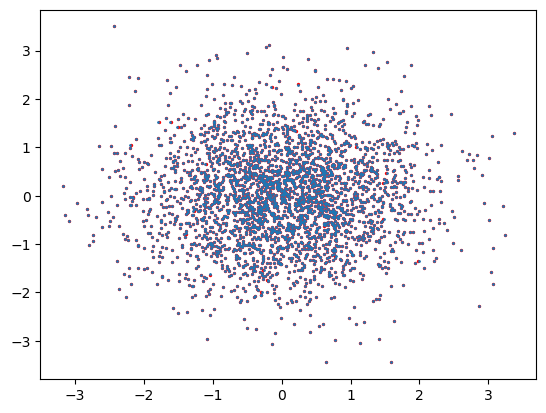

Mean squared error: 1.4578969143030918e-08 


In [16]:
import matplotlib.pyplot as plt
plt.scatter(x[:,0],x[:,1],s=2,c='r')
plt.scatter(z_samples[:,0],z_samples[:,1],s=1)
plt.show()
print(f'Mean squared error: {jnp.mean(jnp.linalg.norm(x-z_samples,axis=1)**2)} ')

Gradient Flow Progress:   0%|          | 0/499 [00:00<?, ?it/s]/work/Sebas/BV_Hamiltonian/Parametric_BV_Hamiltonian/geometry/lin_alg_solvers.py:133: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in zeros is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/jax-ml/jax#current-gotchas for more.
  Tk_under = jnp.zeros((k + 1, k), dtype=jnp.float64)
/work/Sebas/BV_Hamiltonian/Parametric_BV_Hamiltonian/geometry/lin_alg_solvers.py:140: UserWarning: Explicitly requested dtype <class 'jax.numpy.float64'> requested in zeros is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/jax-ml/jax#current-gotchas for more.
  rhs = jnp.zeros((k + 1,), dtype=jnp.float64).at[0].set(beta1)
Gra

Iter  10: Energy = -26.319036, Grad norm: 1.20e+01


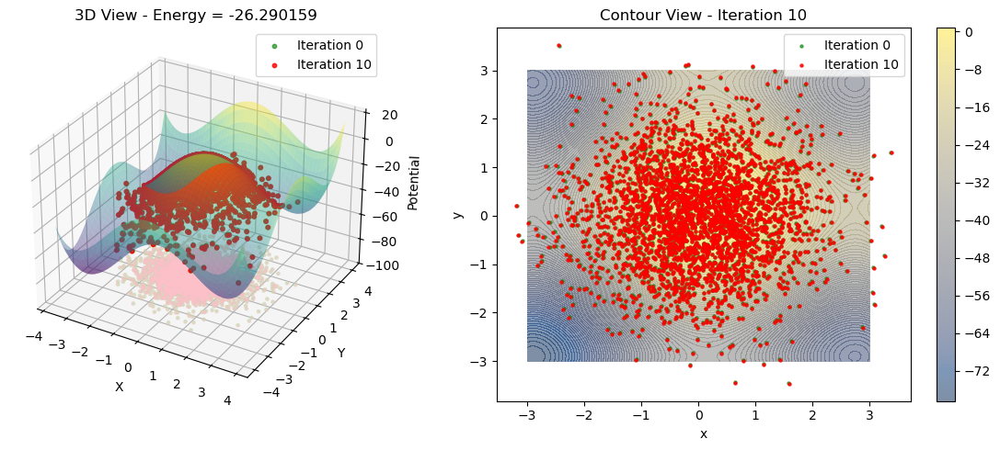

Gradient Flow Progress:   4%|▍         | 20/499 [00:06<01:40,  4.79it/s, Energy=-26.927151, Linear=-26.927151, Internal=0.000000, Interaction=0.000000]

Iter  20: Energy = -26.927151, Grad norm: 1.38e+01


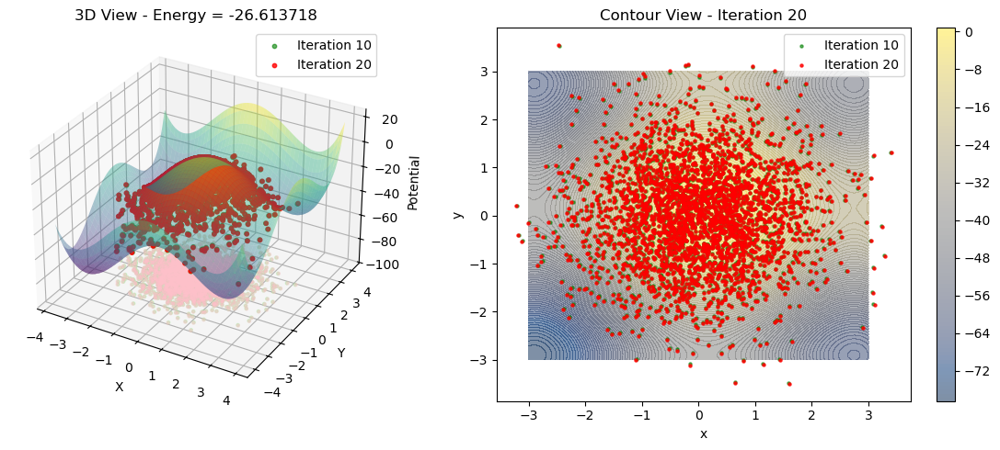

Gradient Flow Progress:   6%|▌         | 30/499 [00:10<01:49,  4.29it/s, Energy=-27.330128, Linear=-27.330128, Internal=0.000000, Interaction=0.000000]

Iter  30: Energy = -27.330128, Grad norm: 1.46e+01


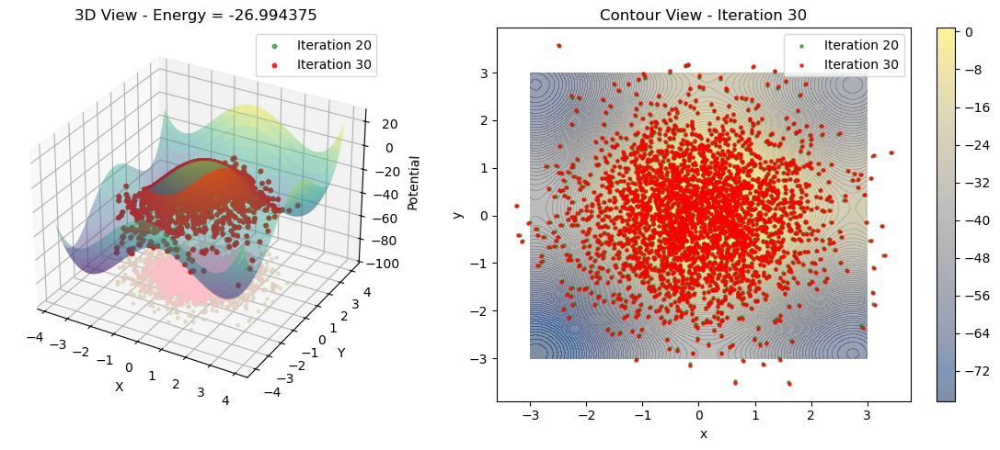

Gradient Flow Progress:   8%|▊         | 40/499 [00:12<01:26,  5.34it/s, Energy=-28.100088, Linear=-28.100088, Internal=0.000000, Interaction=0.000000]

Iter  40: Energy = -28.100088, Grad norm: 1.61e+01


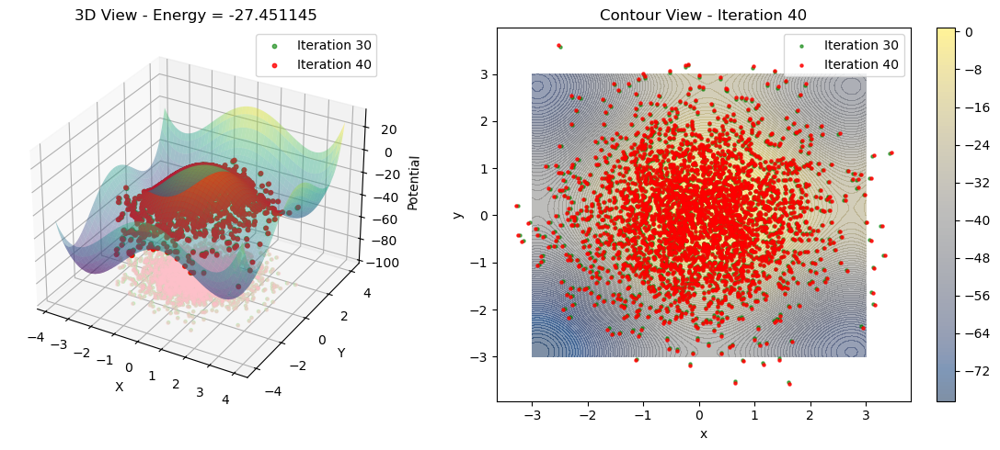

Gradient Flow Progress:  10%|█         | 50/499 [00:16<01:50,  4.06it/s, Energy=-27.937479, Linear=-27.937479, Internal=0.000000, Interaction=0.000000]

Iter  50: Energy = -27.937479, Grad norm: 1.56e+01


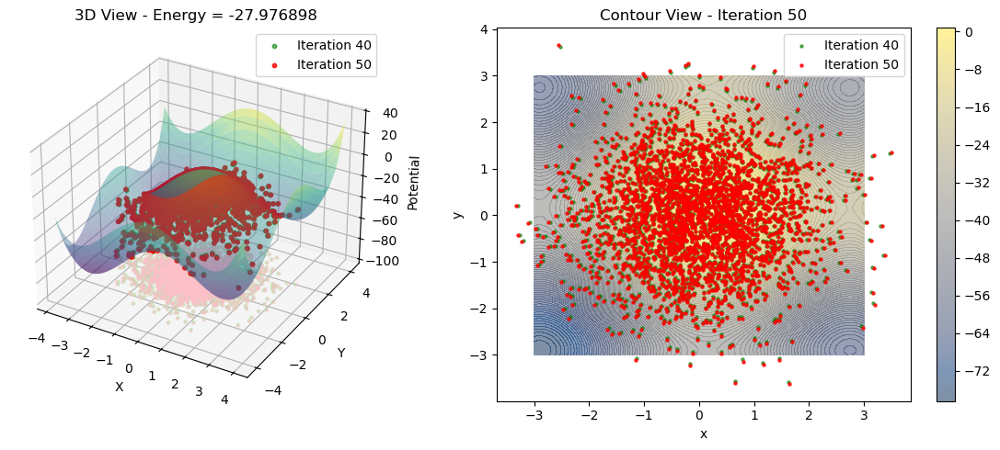

Gradient Flow Progress:  12%|█▏        | 60/499 [00:20<02:04,  3.54it/s, Energy=-28.064167, Linear=-28.064167, Internal=0.000000, Interaction=0.000000]

Iter  60: Energy = -28.064167, Grad norm: 1.66e+01


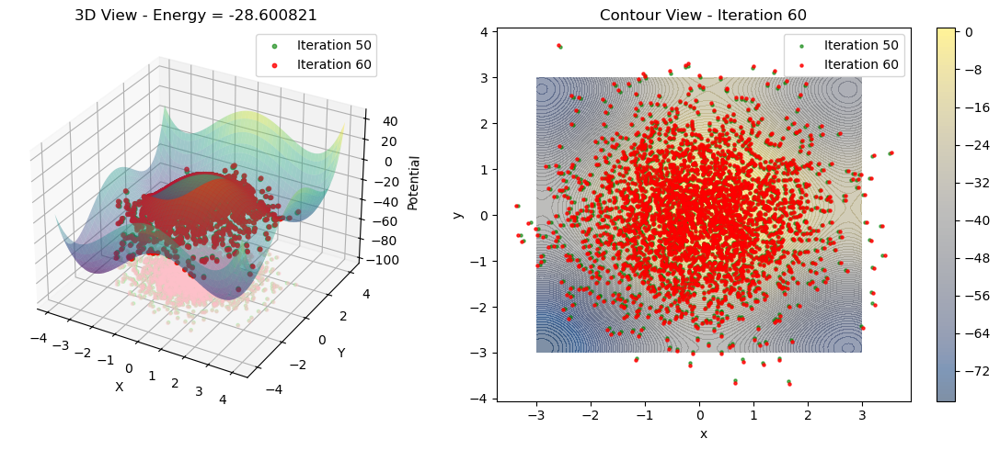

Gradient Flow Progress:  14%|█▍        | 70/499 [00:24<01:58,  3.62it/s, Energy=-28.862856, Linear=-28.862856, Internal=0.000000, Interaction=0.000000]

Iter  70: Energy = -28.862856, Grad norm: 1.75e+01


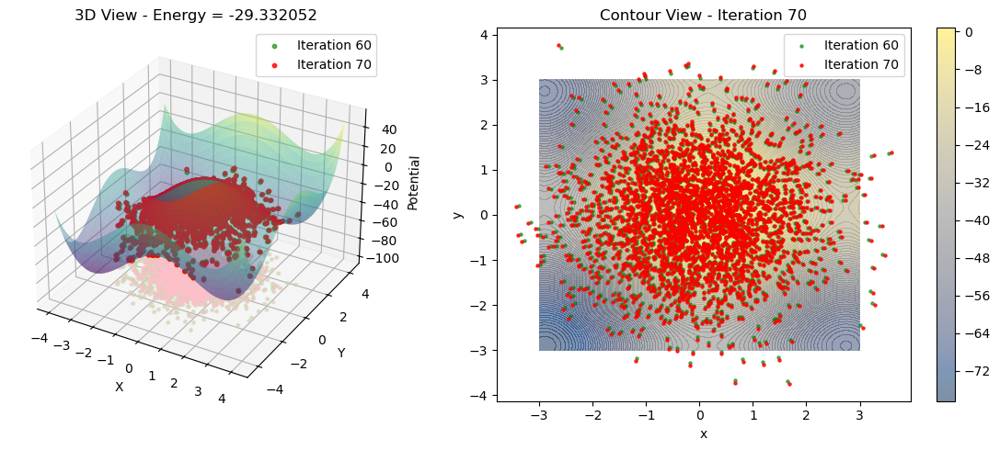

Gradient Flow Progress:  16%|█▌        | 80/499 [00:28<01:57,  3.55it/s, Energy=-30.270895, Linear=-30.270895, Internal=0.000000, Interaction=0.000000]

Iter  80: Energy = -30.270895, Grad norm: 1.81e+01


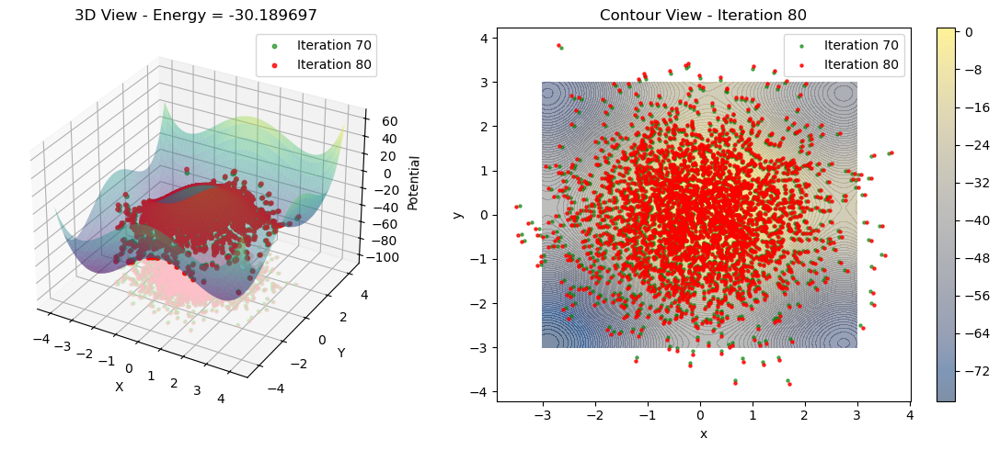

Gradient Flow Progress:  18%|█▊        | 90/499 [00:32<01:59,  3.43it/s, Energy=-30.619476, Linear=-30.619476, Internal=0.000000, Interaction=0.000000]

Iter  90: Energy = -30.619476, Grad norm: 1.94e+01


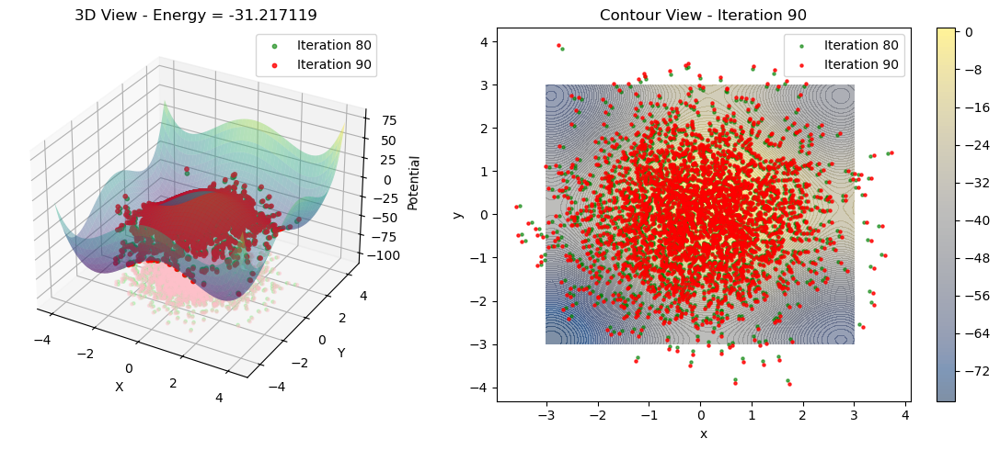

Gradient Flow Progress:  20%|██        | 100/499 [00:36<01:57,  3.39it/s, Energy=-33.208466, Linear=-33.208466, Internal=0.000000, Interaction=0.000000]

Iter 100: Energy = -33.208466, Grad norm: 2.26e+01


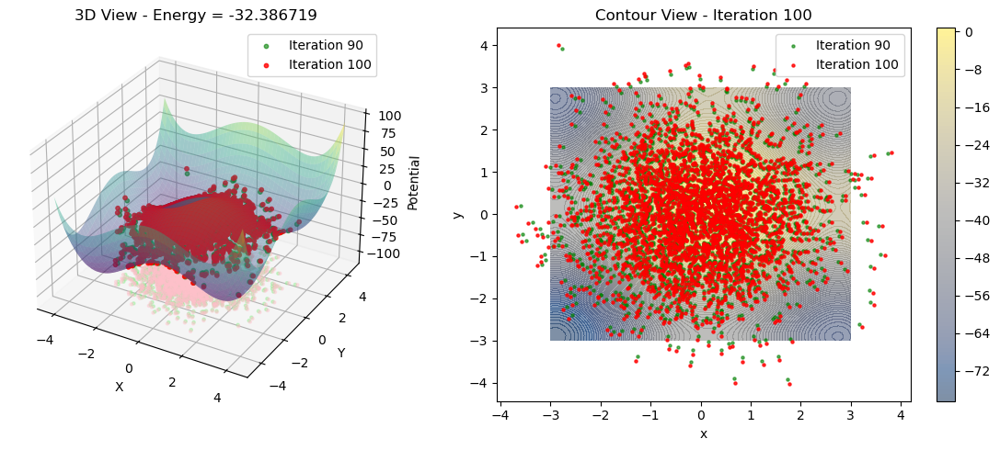

Gradient Flow Progress:  22%|██▏       | 110/499 [00:40<02:11,  2.97it/s, Energy=-33.988953, Linear=-33.988953, Internal=0.000000, Interaction=0.000000]

Iter 110: Energy = -33.988953, Grad norm: 2.27e+01


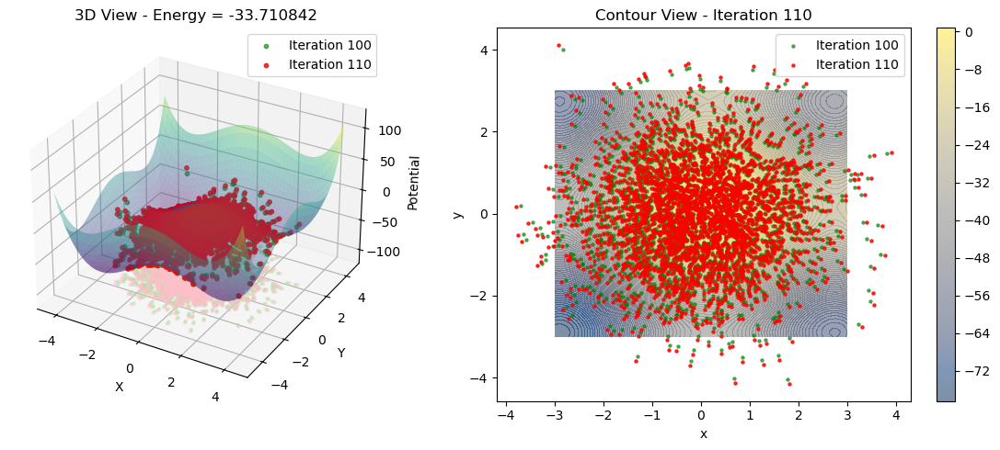

Gradient Flow Progress:  24%|██▍       | 120/499 [00:45<02:01,  3.13it/s, Energy=-35.136139, Linear=-35.136139, Internal=0.000000, Interaction=0.000000]

Iter 120: Energy = -35.136139, Grad norm: 2.35e+01


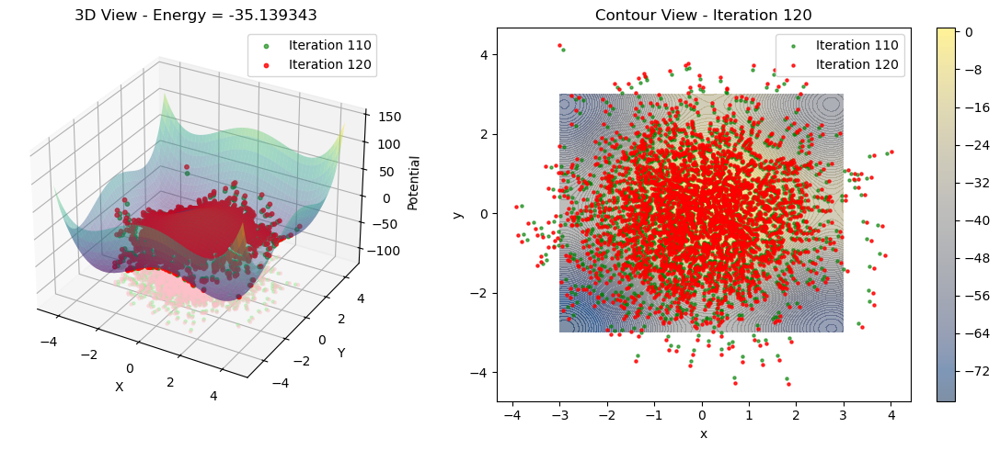

Gradient Flow Progress:  26%|██▌       | 130/499 [00:49<02:06,  2.92it/s, Energy=-37.631386, Linear=-37.631386, Internal=0.000000, Interaction=0.000000]

Iter 130: Energy = -37.631386, Grad norm: 2.59e+01


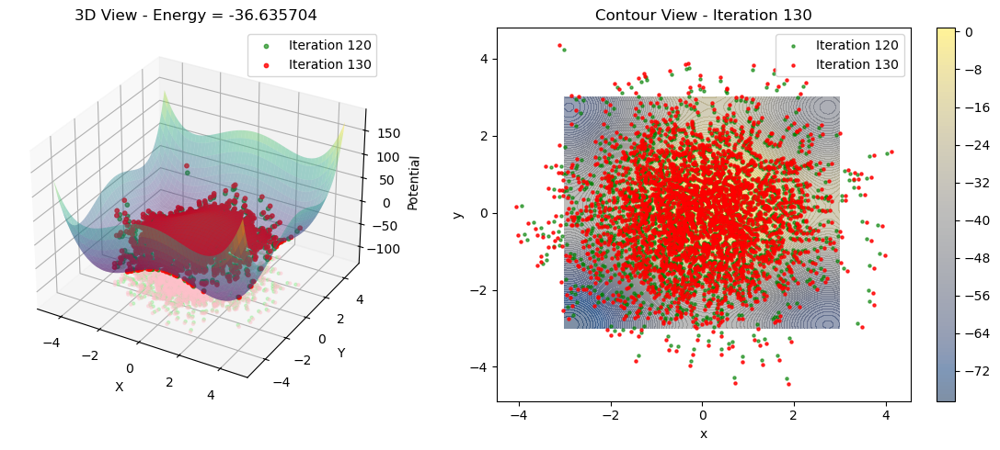

Gradient Flow Progress:  28%|██▊       | 140/499 [00:53<01:55,  3.10it/s, Energy=-38.028809, Linear=-38.028809, Internal=0.000000, Interaction=0.000000]

Iter 140: Energy = -38.028809, Grad norm: 2.74e+01


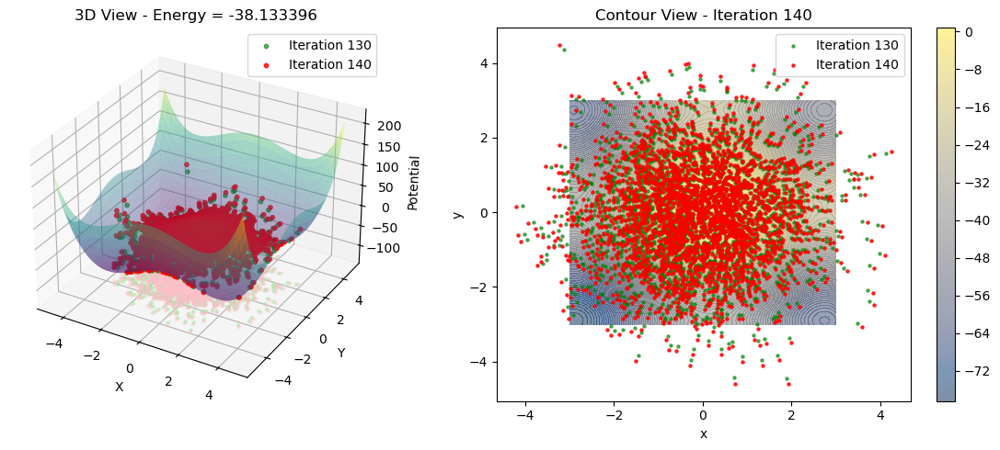

Gradient Flow Progress:  30%|███       | 150/499 [00:58<02:03,  2.82it/s, Energy=-40.290783, Linear=-40.290783, Internal=0.000000, Interaction=0.000000]

Iter 150: Energy = -40.290783, Grad norm: 2.75e+01


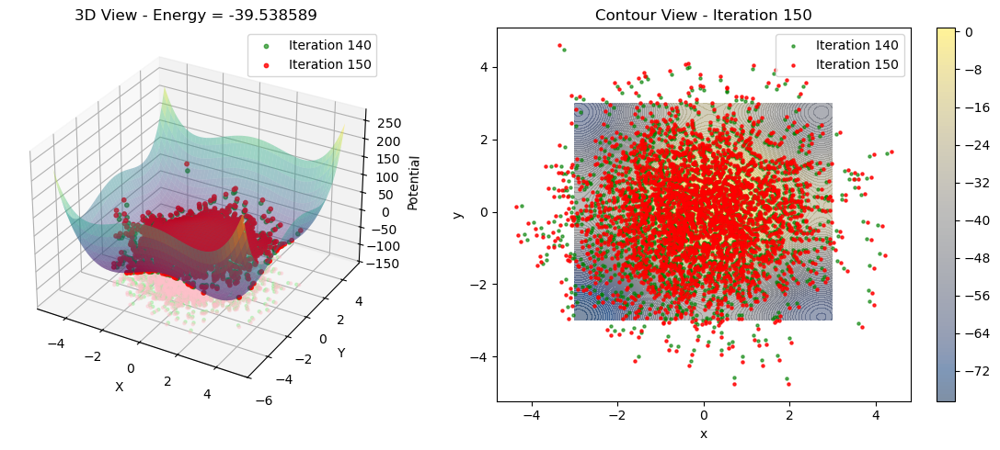

Gradient Flow Progress:  32%|███▏      | 160/499 [01:02<01:35,  3.54it/s, Energy=-41.156399, Linear=-41.156399, Internal=0.000000, Interaction=0.000000]

Iter 160: Energy = -41.156399, Grad norm: 2.54e+01


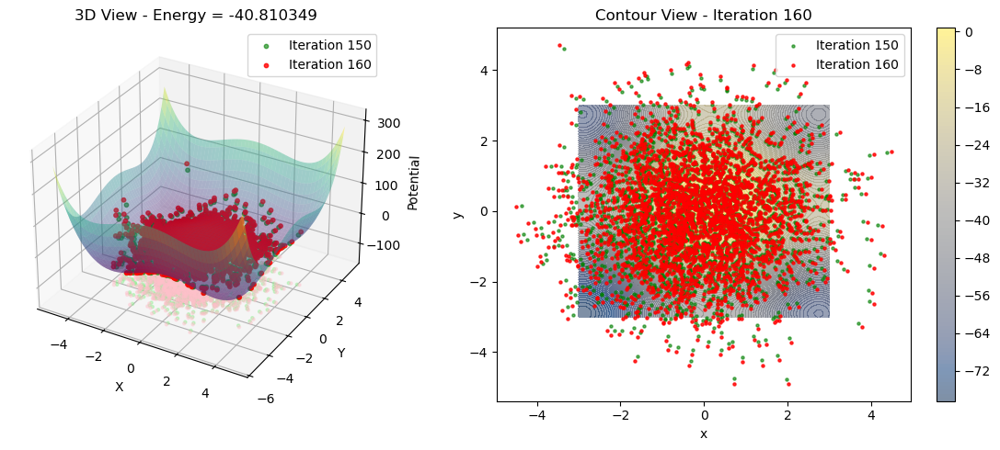

Gradient Flow Progress:  34%|███▍      | 170/499 [01:06<01:30,  3.63it/s, Energy=-41.671722, Linear=-41.671722, Internal=0.000000, Interaction=0.000000]

Iter 170: Energy = -41.671722, Grad norm: 2.61e+01


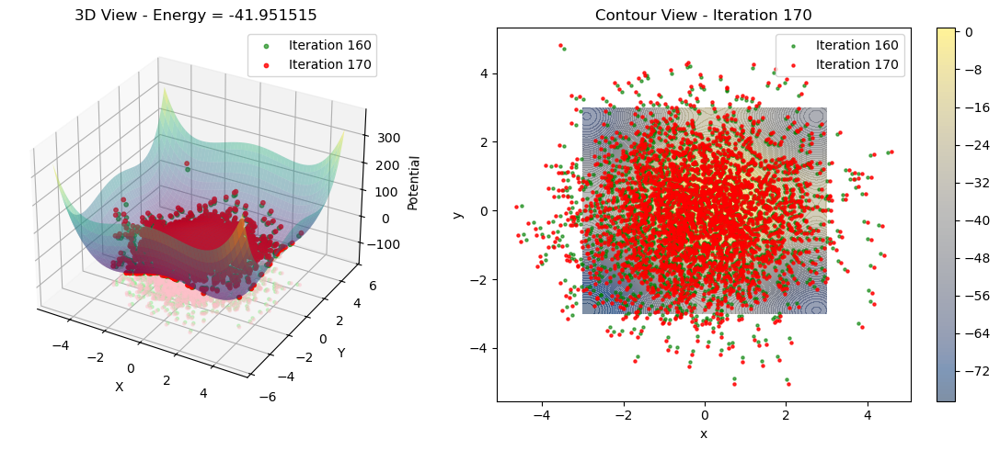

Gradient Flow Progress:  36%|███▌      | 180/499 [01:10<01:34,  3.38it/s, Energy=-42.617817, Linear=-42.617817, Internal=0.000000, Interaction=0.000000]

Iter 180: Energy = -42.617817, Grad norm: 2.69e+01


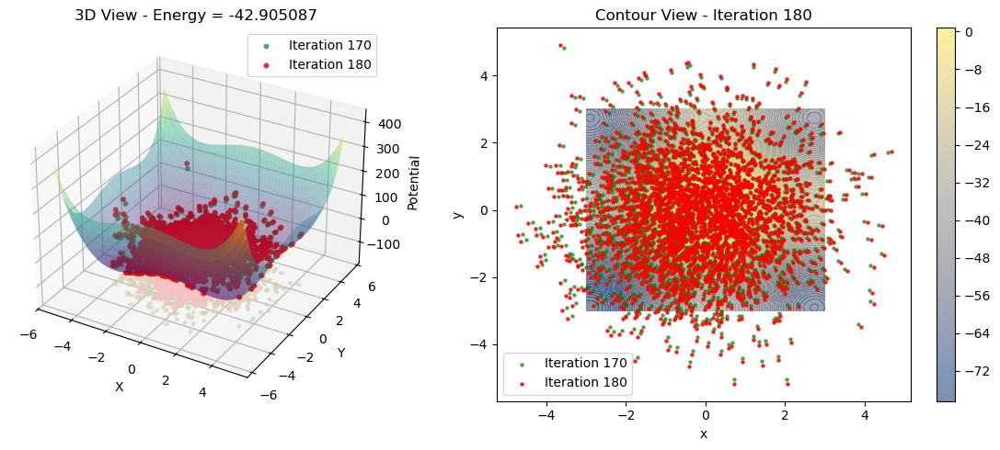

Gradient Flow Progress:  38%|███▊      | 190/499 [01:14<01:26,  3.56it/s, Energy=-44.878639, Linear=-44.878639, Internal=0.000000, Interaction=0.000000]

Iter 190: Energy = -44.878639, Grad norm: 2.59e+01


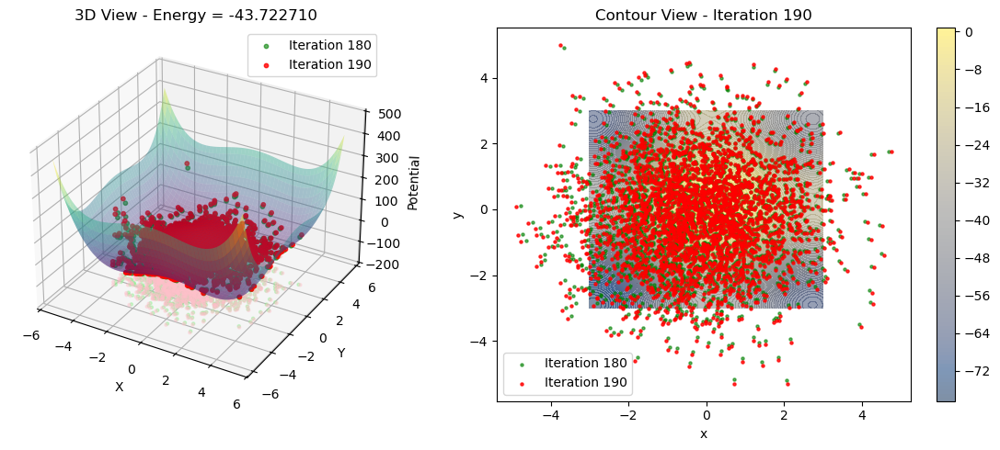

Gradient Flow Progress:  40%|████      | 200/499 [01:17<01:10,  4.26it/s, Energy=-45.232136, Linear=-45.232136, Internal=0.000000, Interaction=0.000000]

Iter 200: Energy = -45.232136, Grad norm: 2.29e+01


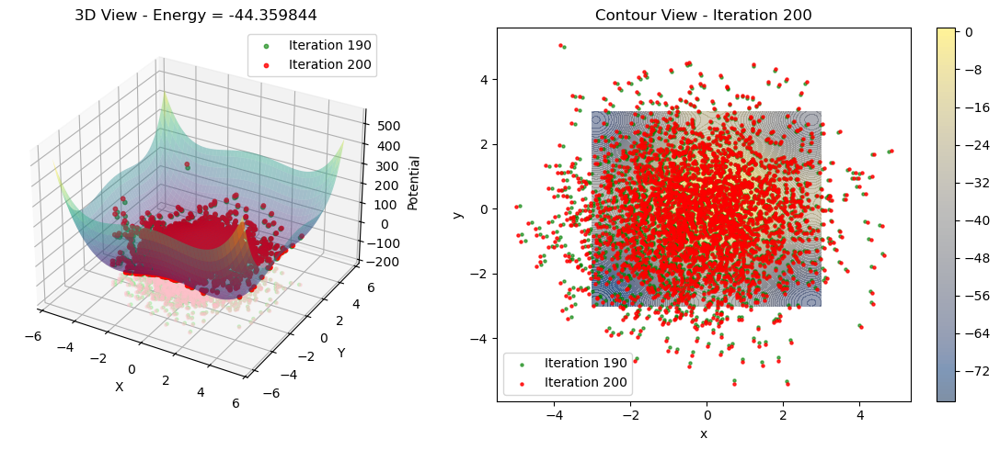

Gradient Flow Progress:  42%|████▏     | 210/499 [01:21<01:12,  3.96it/s, Energy=-45.444084, Linear=-45.444084, Internal=0.000000, Interaction=0.000000]

Iter 210: Energy = -45.444084, Grad norm: 2.10e+01


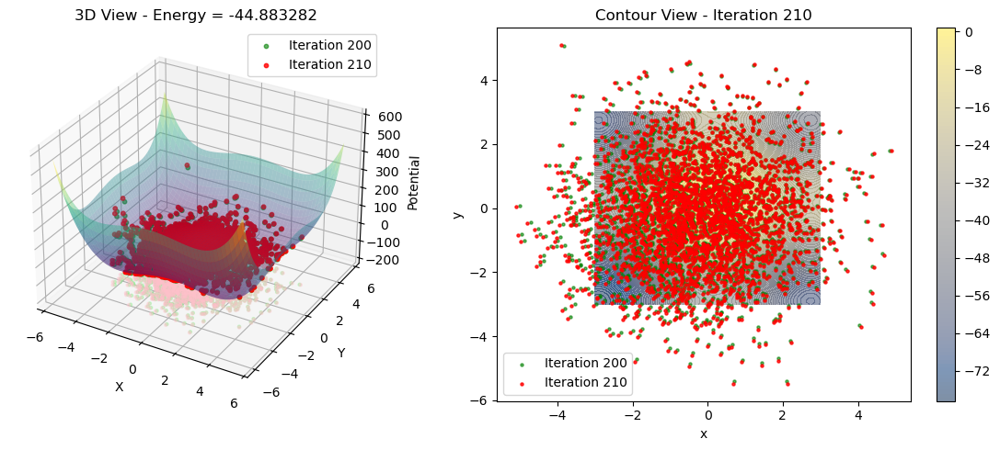

Gradient Flow Progress:  44%|████▍     | 220/499 [01:25<01:19,  3.52it/s, Energy=-46.553703, Linear=-46.553703, Internal=0.000000, Interaction=0.000000]

Iter 220: Energy = -46.553703, Grad norm: 2.11e+01


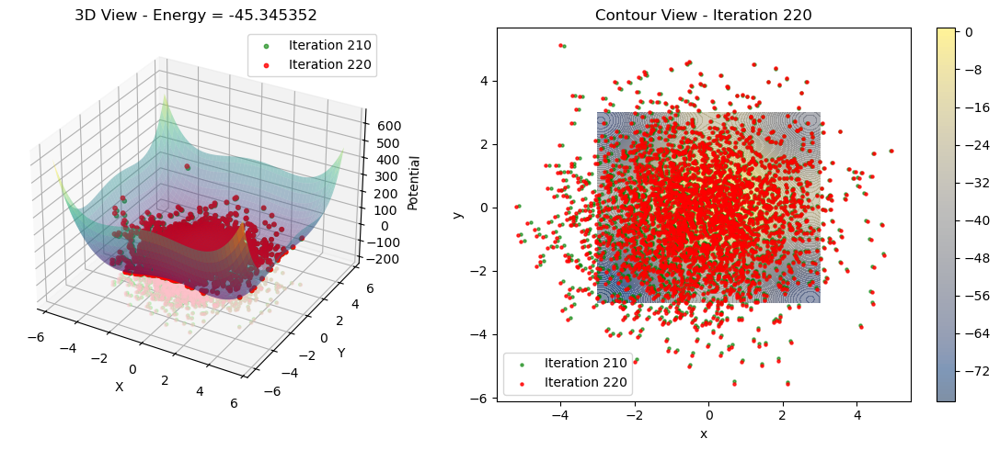

Gradient Flow Progress:  46%|████▌     | 230/499 [01:29<01:21,  3.32it/s, Energy=-45.665161, Linear=-45.665161, Internal=0.000000, Interaction=0.000000]

Iter 230: Energy = -45.665161, Grad norm: 1.88e+01


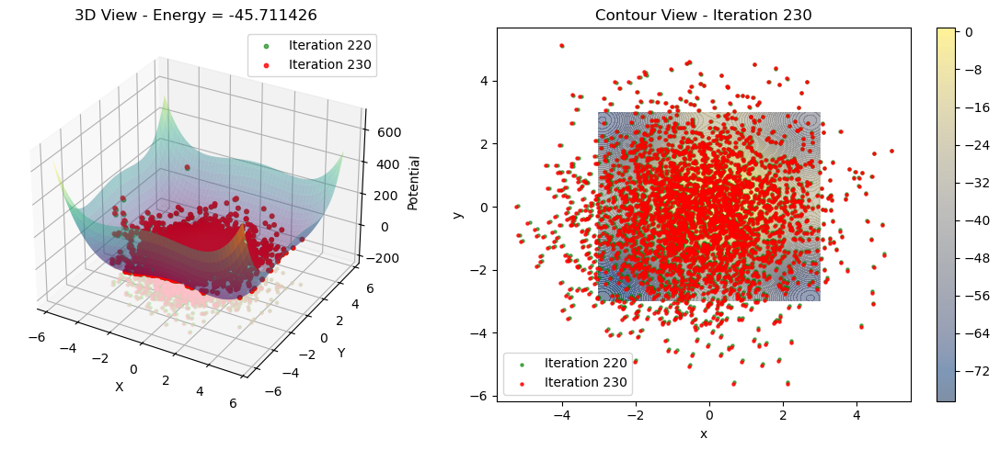

Gradient Flow Progress:  48%|████▊     | 240/499 [01:33<01:12,  3.58it/s, Energy=-45.688210, Linear=-45.688210, Internal=0.000000, Interaction=0.000000]

Iter 240: Energy = -45.688210, Grad norm: 1.74e+01


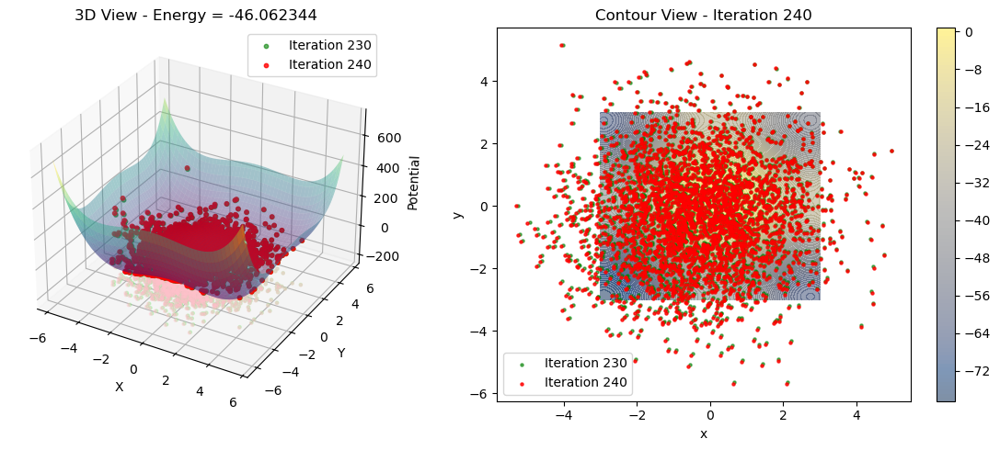

Gradient Flow Progress:  50%|█████     | 250/499 [01:36<01:14,  3.33it/s, Energy=-46.075459, Linear=-46.075459, Internal=0.000000, Interaction=0.000000]

Iter 250: Energy = -46.075459, Grad norm: 1.72e+01


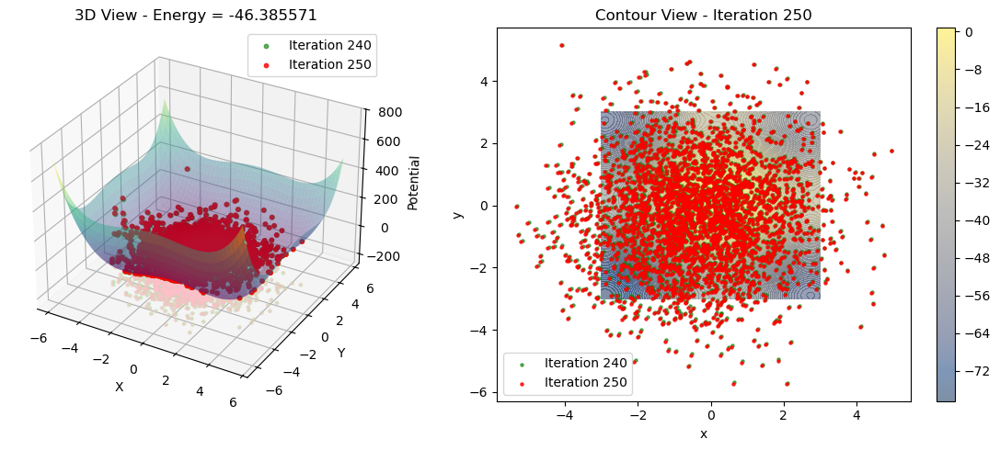

Gradient Flow Progress:  52%|█████▏    | 260/499 [01:40<01:03,  3.75it/s, Energy=-46.899689, Linear=-46.899689, Internal=0.000000, Interaction=0.000000]

Iter 260: Energy = -46.899689, Grad norm: 2.04e+01


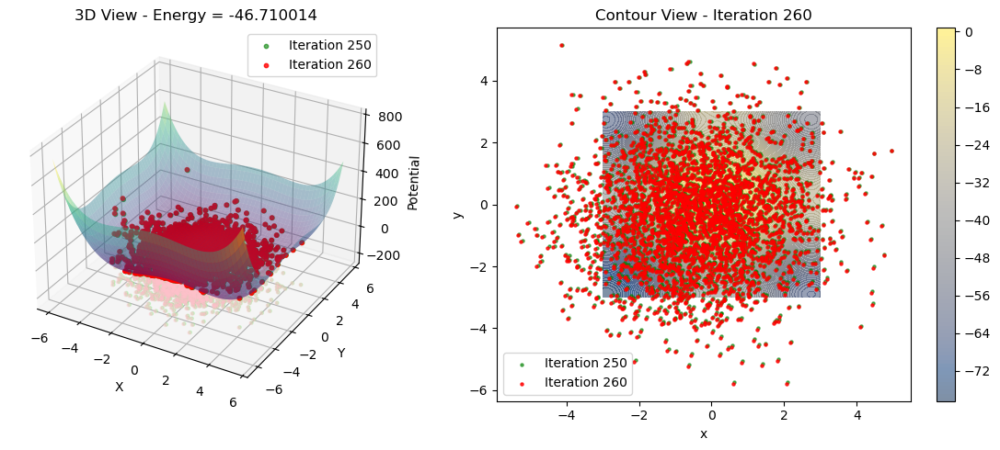

Gradient Flow Progress:  54%|█████▍    | 270/499 [01:45<01:17,  2.95it/s, Energy=-48.845917, Linear=-48.845917, Internal=0.000000, Interaction=0.000000]

Iter 270: Energy = -48.845917, Grad norm: 1.89e+01


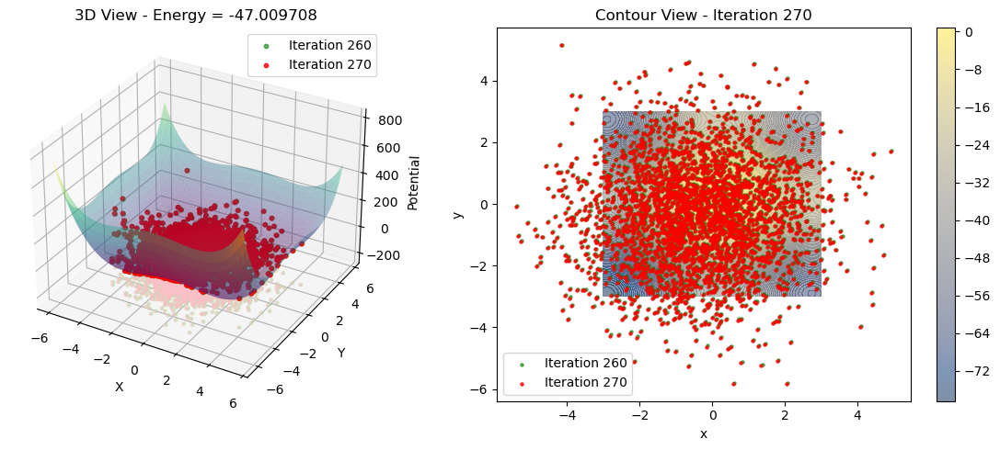

Gradient Flow Progress:  56%|█████▌    | 280/499 [01:49<01:14,  2.93it/s, Energy=-46.685978, Linear=-46.685978, Internal=0.000000, Interaction=0.000000]

Iter 280: Energy = -46.685978, Grad norm: 1.75e+01


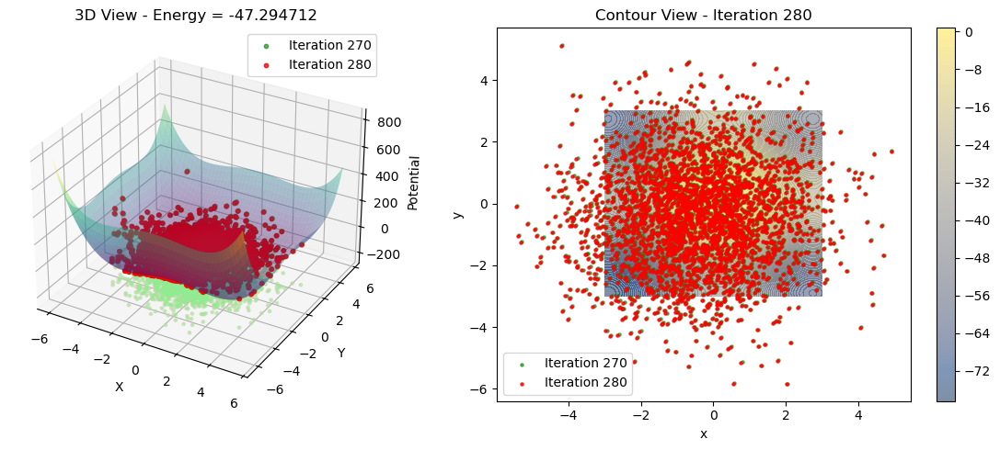

Gradient Flow Progress:  58%|█████▊    | 290/499 [01:54<01:11,  2.93it/s, Energy=-48.767208, Linear=-48.767208, Internal=0.000000, Interaction=0.000000]

Iter 290: Energy = -48.767208, Grad norm: 1.82e+01


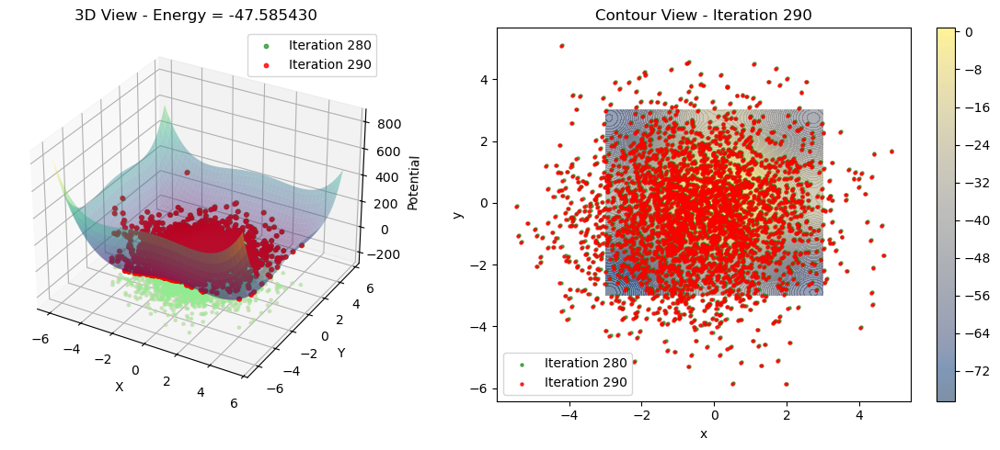

Gradient Flow Progress:  60%|██████    | 300/499 [01:58<01:07,  2.94it/s, Energy=-47.568237, Linear=-47.568237, Internal=0.000000, Interaction=0.000000]

Iter 300: Energy = -47.568237, Grad norm: 2.01e+01


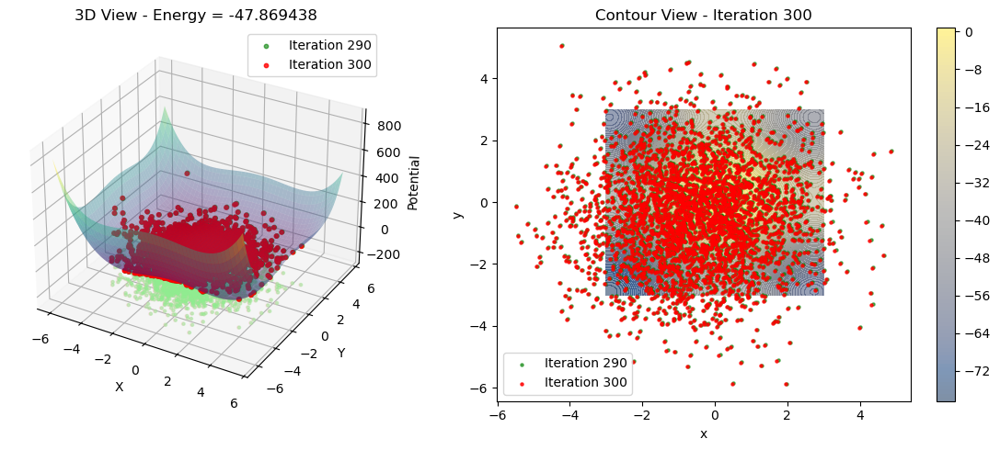

Gradient Flow Progress:  62%|██████▏   | 310/499 [02:03<01:00,  3.12it/s, Energy=-48.888603, Linear=-48.888603, Internal=0.000000, Interaction=0.000000]

Iter 310: Energy = -48.888603, Grad norm: 1.65e+01


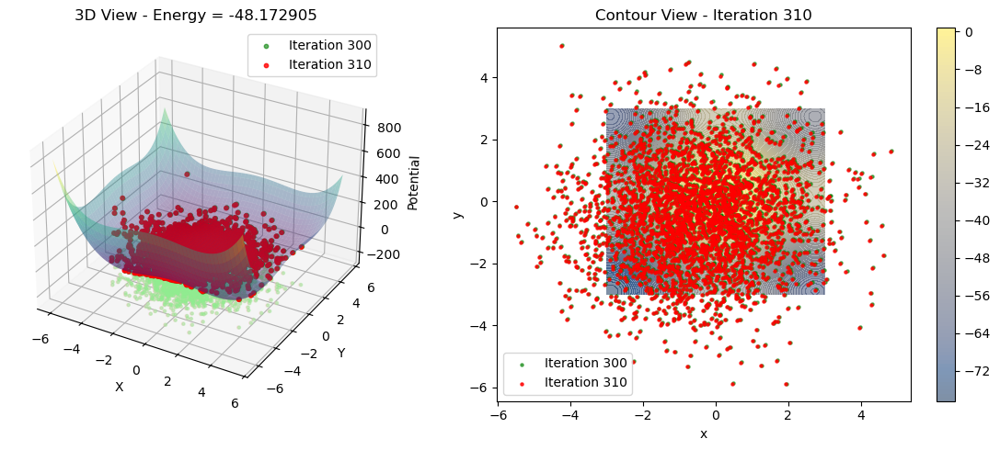

Gradient Flow Progress:  63%|██████▎   | 315/499 [02:05<01:13,  2.50it/s, Energy=-48.933540, Linear=-48.933540, Internal=0.000000, Interaction=0.000000]
/work/Sebas/BV_Hamiltonian/Parametric_BV_Hamiltonian/geometry/G_matrix.py:148: SyntaxWarning: invalid escape sequence '\p'
  [neta^T \partial_{theta_k} G(theta) neta]_{k=1}^{N_params}


KeyboardInterrupt: 

In [17]:

results = run_gradient_flow(
    parametric_model, z_samples, G_mat_flow,
    potential
    ,solver=solver,
    h=h, max_iterations=max_iterations, tolerance=tolerance,
    progress_every=10,regularization=1e-6
)

In [ ]:
# Visualize results
visualize_gradient_flow_results(results)

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

def visualize_gradient_flow_3d(results: dict, potential: Potential, figsize: tuple = (15, 12), x_range=None, y_range=None):
    """
    Enhanced 3D visualization showing particles on potential surface and contour plane
    
    Args:
        results: Results dictionary from run_gradient_flow
        potential_func: Function that takes (x, y) and returns potential value
        figsize: Figure size for plots
    """
    fig = plt.figure(figsize=figsize)
    
    # Create 3D subplot
    ax_3d = fig.add_subplot(221, projection='3d')
    
    # Get particle data
    initial_samples = results['sample_history'][0]
    final_samples = results['sample_history'][-1]
    
    # Create potential surface mesh
    if x_range is None:
        x_range = jnp.linspace(initial_samples[:,0].min() - 0.5, initial_samples[:,0].max() + 0.5, 100)
    if y_range is None:
        y_range = jnp.linspace(initial_samples[:,1].min() - 0.5, initial_samples[:,1].max() + 0.5, 100)
    # x_range = jnp.linspace(initial_samples[:,0].min() , initial_samples[:,0].max(), 100)
    # y_range = jnp.linspace(initial_samples[:,1].min() , initial_samples[:,1].max(), 100)
    X, Y = jnp.meshgrid(x_range, y_range)
    Z = jnp.zeros_like(X)

    # Evaluate potential on mesh
    Z = potential.linear.potential_fn(jnp.stack([X.ravel(), Y.ravel()], axis=-1),**potential.linear.potential_kwargs).reshape(X.shape)

    base_z = Z.min() - 0.3 * (Z.max() - Z.min())
    # base_x = X.min() - 0.3 * (X.max() - X.min())
    # base_y = Y.min() - 0.3 * (Y.max() - Y.min())

    # Plot potential surface
    ax_3d.plot_surface(X, Y, Z, cmap='viridis', antialiased=True,alpha = 0.3) #
    ax_3d.contour(X, Y, Z,zdir ='z', offset=base_z, levels=150, colors='gray', alpha=0.3)
    # ax_3d.contour(X, Y, Z,zdir ='y',levels = 150,alhpa = 0.3,cmap='viridis')
    # ax_3d.contour(X, Y, Z,zdir ='x',levels = 150,alhpa = 0.3,cmap='viridis')

    # Plot particles at surface level (elevated by potential value)
    # surface_z_initial = np.array([potential_func(x, y) for x, y in initial_samples])
    # surface_z_final = np.array([potential_func(x, y) for x, y in final_samples])
    surface_z_initial = potential.linear.potential_fn(jnp.array(initial_samples),**potential.linear.potential_kwargs)
    surface_z_final = potential.linear.potential_fn(jnp.array(final_samples),**potential.linear.potential_kwargs)

    
    # Surface particles
    ax_3d.scatter(initial_samples[:,0], initial_samples[:,1], surface_z_initial, 
                  c='blue', s=20, alpha=0.6, label='Initial (surface)')
    ax_3d.scatter(final_samples[:,0], final_samples[:,1], surface_z_final, 
                  c='red', s=20, alpha=0.8, label='Final (surface)')
    
    # Contour particles (at base level)
    base_z = Z.min() - 0.5 * (Z.max() - Z.min())
    ax_3d.scatter(initial_samples[:,0], initial_samples[:,1], base_z, 
                  c='lightblue', s=10, alpha=0.4, label='Initial (contour)')
    ax_3d.scatter(final_samples[:,0], final_samples[:,1], base_z, 
                  c='pink', s=10, alpha=0.4, label='Final (contour)')
    
    # Add drop lines for final particles
    for i in range(0, len(final_samples), 5):  # Show every 5th particle to avoid clutter
        x, y = final_samples[i]
        z_surf = surface_z_final[i]
        ax_3d.plot([x, x], [y, y], [base_z, z_surf], 'r-', alpha=0.3, linewidth=0.5)
    
    ax_3d.set_xlabel('X')
    ax_3d.set_ylabel('Y')
    ax_3d.set_zlabel('Potential')
    ax_3d.set_title('3D Particle Flow on Potential Surface')
    ax_3d.legend()
    
    # Energy decay plot
    ax_energy = fig.add_subplot(222)
    ax_energy.plot(abs(jnp.array(results['energy_history'])))
    ax_energy.set_xlabel('Iteration')
    ax_energy.set_ylabel('Energy')
    ax_energy.set_title('Energy Decay')
    ax_energy.grid(True)
    ax_energy.set_yscale('log')
    
    # 2D contour plot with particles
    ax_contour = fig.add_subplot(223)
    contour = ax_contour.contour(X, Y, Z, levels=15, colors='gray', alpha=0.5)
    ax_contour.contourf(X, Y, Z, levels=15, alpha=0.3, cmap='viridis')
    ax_contour.scatter(initial_samples[:,0], initial_samples[:,1], 
                      c='blue', s=10, alpha=0.6, label='Initial')
    ax_contour.scatter(final_samples[:,0], final_samples[:,1], 
                      c='red', s=10, alpha=0.8, label='Final')
    ax_contour.set_xlabel('X')
    ax_contour.set_ylabel('Y')
    ax_contour.set_title('Contour View')
    ax_contour.legend()
    ax_contour.set_aspect('equal')
    
    # Parameter evolution
    ax_params = fig.add_subplot(224)
    ax_params.plot(results['param_norms'])
    ax_params.set_xlabel('Iteration')
    ax_params.set_ylabel('Parameter Norm')
    ax_params.set_title('Parameter Evolution')
    ax_params.grid(True)
    
    plt.tight_layout()
    plt.show()


def animate_gradient_flow_3d(results: dict, potential, save_path=None):
    """
    Animate the 3D particle flow over time
    
    Args:
        results: Results dictionary from run_gradient_flow
        potential_func: Function that takes (x, y) and returns potential value
        save_path: Optional path to save animation as gif
    """
    from matplotlib.animation import FuncAnimation
    
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Create surface mesh
    sample_history = results['sample_history']
    all_samples = np.vstack(sample_history)
    
    x_range = np.linspace(all_samples[:,0].min() - 0.5, all_samples[:,0].max() + 0.5, 100)
    y_range = np.linspace(all_samples[:,1].min() - 0.5, all_samples[:,1].max() + 0.5, 100)
    X, Y = np.meshgrid(x_range, y_range)
    Z = potential.linear.potential_fn(jnp.stack([X.ravel(), Y.ravel()], axis=-1),**potential.linear.potential_kwargs).reshape(X.shape)

    # Plot static surface
    ax.plot_surface(X, Y, Z, alpha=0.4, cmap='viridis', linewidth=0)
    
    # Base level for contour particles
    base_z = Z.min() - 0.3 * (Z.max() - Z.min())
    
    def animate(frame):
        ax.clear()
        
        
        
        # Get current samples
        current_samples = sample_history[frame]
        surface_z = potential.linear.potential_fn(jnp.array(current_samples),**potential.linear.potential_kwargs)

        x_min = current_samples[:,0].min() - 0.5
        x_max = current_samples[:,0].max() + 0.5
        y_min = current_samples[:,1].min() - 0.5
        y_max = current_samples[:,1].max() + 0.5

        X, Y = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
        Z = potential.linear.potential_fn(jnp.stack([X.ravel(), Y.ravel()], axis=-1),**potential.linear.potential_kwargs).reshape(X.shape)

        base_z = Z.min() - 0.3 * (Z.max() - Z.min())

        # Redraw surface
        ax.plot_surface(X, Y, Z, alpha=0.2, cmap='viridis', linewidth=0)
        ax.contour(X, Y, Z,zdir ='z', offset=base_z, levels=150, colors='gray', alpha=0.3)
        ax.contour(X, Y, Z,zdir ='y', offset=base_z, levels=150, alpha=0.3, cmap='viridis')

        # Plot surface particles
        ax.scatter(current_samples[:,0], current_samples[:,1], surface_z, 
                  c='red', s=10, alpha=0.8, label='Surface particles')
        
        # Plot contour particles
        ax.scatter(current_samples[:,0], current_samples[:,1], base_z, 
                  c='blue', s=10, alpha=0.5, label='Contour particles')
        
        # Add some drop lines
        for i in range(0, len(current_samples), 10):
            x, y = current_samples[i]
            z_surf = surface_z[i]
            ax.plot([x, x], [y, y], [base_z, z_surf], 'r-', alpha=0.3, linewidth=0.5)
        
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Potential')
        ax.set_title(f'Gradient Flow Animation - Step {frame}/{len(sample_history)-1}')
        ax.legend()
        
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        # Keep consistent view
        # ax.set_xlim(x_range[0], x_range[-1])
        # ax.set_ylim(y_range[0], y_range[-1])
        ax.set_zlim(Z.min(), Z.max())
    
    anim = FuncAnimation(fig, animate, frames=len(sample_history), interval=400, blit=False)
    
    if save_path:
        anim.save(save_path, writer='pillow', fps=3)
    
    plt.show()
    return anim


# Example usage:
visualize_gradient_flow_3d(results, potential,x_range=jnp.linspace(-2,2,100),y_range=jnp.linspace(-2,2,100))  # Simple quadratic potential
anim = animate_gradient_flow_3d(results, potential, 'flow_animation.gif')

In [ ]:
final_node = results['final_parametric_model']
G_mat = G_matrix(final_node)
h = 1e-2
max_iterations = 150

In [ ]:

results_ = run_gradient_flow(
    final_node, z_samples, G_mat,
    potential
    ,solver=solver,
    h=h, max_iterations=max_iterations, tolerance=tolerance,
    progress_every=5
)

In [ ]:
# Example usage:
visualize_gradient_flow_3d(results_, potential,x_range=jnp.linspace(-4,4,100),y_range=jnp.linspace(-4,4,100))  # Simple quadratic potential
anim = animate_gradient_flow_3d(results_, potential, 'flow_animation2.gif')